# To know

## Load data

In [5]:
import pandas as pd
df = pd.read_csv('1_linear_regression/USA_Housing.csv')
df.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386


## Transform data

### Log normalize

[Data transformation statistics](https://en.wikipedia.org/wiki/Data_transformation_%28statistics%29)

In statistics, data transformation is the application of a deterministic mathematical function to each point in a data set — that is, each data point zi is replaced with the transformed value yi = f(zi), where f is a function. **Transforms are usually applied so that the data appear to more closely meet the assumptions of a statistical inference procedure that is to be applied, or to improve the interpretability or appearance of graphs.**

Nearly always, the function that is used to transform the data is invertible, and generally is continuous. **The transformation is usually applied to a collection of comparable measurements. For example, if we are working with data on peoples' incomes in some currency unit, it would be common to transform each person's income value by the logarithm function.**

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
%matplotlib inline

hitters = pd.read_csv('data/Hitters.csv')
hitters.columns = hitters.columns[1:].insert(0, 'Name')
hitters.head()

,Name,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,...,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,-Andy Allanson,293,66,1,30,29,14,1,293,66,...,30,29,14,A,E,446,33,20,NaN,A
1,-Alan Ashby,315,81,7,24,38,39,14,3449,835,...,321,414,375,N,W,632,43,10,475.0,N
2,-Alvin Davis,479,130,18,66,72,76,3,1624,457,...,224,266,263,A,W,880,82,14,480.0,A
3,-Andre Dawson,496,141,20,65,78,37,11,5628,1575,...,828,838,354,N,E,200,11,3,500.0,N
4,-Andres Galarraga,321,87,10,39,42,30,2,396,101,...,48,46,33,N,E,805,40,4,91.5,N


In [13]:
# 322 rows
# 263 not null salary rows: hitters['Salary'].count()
# 59 nulls salary rows: hitters[~hitters['Salary'].isnull()].count()
notNullSalaryHitters = hitters[~hitters['Salary'].isnull()]
notNullSalaryHitters.head(50)

,Name,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,...,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
1,-Alan Ashby,315,81,7,24,38,39,14,3449,835,...,321,414,375,N,W,632,43,10,475.000,N
2,-Alvin Davis,479,130,18,66,72,76,3,1624,457,...,224,266,263,A,W,880,82,14,480.000,A
3,-Andre Dawson,496,141,20,65,78,37,11,5628,1575,...,828,838,354,N,E,200,11,3,500.000,N
4,-Andres Galarraga,321,87,10,39,42,30,2,396,101,...,48,46,33,N,E,805,40,4,91.500,N
5,-Alfredo Griffin,594,169,4,74,51,35,11,4408,1133,...,501,336,194,A,W,282,421,25,750.000,A
6,-Al Newman,185,37,1,23,8,21,2,214,42,...,30,9,24,N,E,76,127,7,70.000,A
7,-Argenis Salazar,298,73,0,24,24,7,3,509,108,...,41,37,12,A,W,121,283,9,100.000,A
8,-Andres Thomas,323,81,6,26,32,8,2,341,86,...,32,34,8,N,W,143,290,19,75.000,N
9,-Andre Thornton,401,92,17,49,66,65,13,5206,1332,...,784,890,866,A,E,0,0,0,1100.000,A
10,-Alan Trammell,574,159,21,107,75,59,10,4631,1300,...,702,504,488,A,E,238,445,22,517.143,A


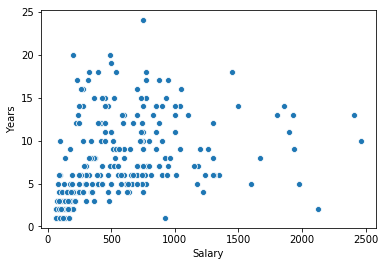

In [17]:
# sns.distplot(notNullSalaryHitters['Salary'], bins = 20)
sns.scatterplot(x='Salary', y='Years', data=notNullSalaryHitters)

In [18]:
# Log10 is applied to x and y. See example in (https://en.wikipedia.org/wiki/Data_transformation_%28statistics%29)
newdatalog10 = np.log10(notNullSalaryHitters[['Salary']]).join(notNullSalaryHitters[['Years']])

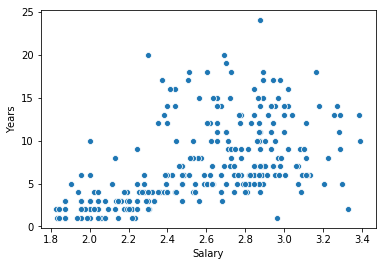

In [19]:
# sns.distplot(np.log2(notNullSalaryHitters['Salary']), bins = 20)
sns.scatterplot(x='Salary', y='Years', data=newdatalog10)

## Clean data

### Modify string

In [6]:
import pandas as pd
tocleandf = pd.read_excel('data/tabn322.10.xls', header = 1)
cleandf = tocleandf
cleandf['Field of study'] = tocleandf['Field of study'].str.replace('.','').copy()

In [7]:
cleandf.set_index('Field of study', inplace=True)

In [8]:
cleandf.head()

,1970-71,1975-76,1980-81,1985-86,1990-91,1995-96,2000-01,2005-06,2006-07,2007-08,2008-09,2009-10,2010-11,2011-12,2012-13,2013-14,2014-15,2015-16
Field of study,,,,,,,,,,,,,,,,,,
NaN,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0
Total,839730.0,925746.0,935140.0,987823.0,1094538.0,1164792.0,1244171.0,1485242.0,1524092.0,1563069.0,1601399.0,1649919.0,1716053.0,1792163.0,1840381.0,1870150.0,1894969.0,1920718.0
Agriculture and natural resources,12672.0,19402.0,21886.0,16823.0,13124.0,21425.0,23370.0,23053.0,23133.0,24113.0,24982.0,26343.0,28630.0,30972.0,33592.0,35125.0,36278.0,37005.0
Architecture and related services,5570.0,9146.0,9455.0,9119.0,9781.0,8352.0,8480.0,9515.0,9717.0,9805.0,10119.0,10051.0,9831.0,9727.0,9757.0,9149.0,9090.0,8823.0
"Area, ethnic, cultural, gender, and group studies",2579.0,3577.0,2887.0,3021.0,4776.0,5633.0,6160.0,7879.0,8194.0,8454.0,8772.0,8620.0,8955.0,9228.0,8850.0,8275.0,7783.0,7840.0


### Apply a function to all dataset

In [9]:
train = pd.read_csv('2_logistic_regression/titanic_train.csv')

In [10]:
def impu_age(cols):
    Age = cols[0]
    Pclass = cols[1]
    
    if pd.isnull(Age):
        if Pclass == 1:
            return 37
        elif Pclass == 2:
            return 29
        else:
            return 24
    else:
        return Age

In [11]:
train['Age'] = train[['Age', 'Pclass']].apply(impu_age, axis=1)

### Convert text column to numerical value

A column which has the unique text 'male' or 'female' can be converted to values 0 or 1.

```pd.get_dummies(train['Sex'])``` creates two columns with each value mutualy excluding the value of the other column (male or female, no other choice).

When two columns created by pd.get_dummies(train['Sex']) are colinear (male or female) it becomes a multicolinearity problem.

Multicolinearity is an issue for machine learning, we have to avoid it.

To avoid multicolinearity we drop the column female and keep only the male column as 0 or 1.
We do that with:

- drop_first=True

In [12]:
train['Sex'].head()

0      male
1    female
2    female
3    female
4      male
Name: Sex, dtype: object

In [13]:
sex = pd.get_dummies(train['Sex'], drop_first=True).head()

You can then concatenate the new column 'male' to the dataframe 'train' and drop the old column 'Sex'.

In [14]:
train = pd.concat([train, sex], axis=1)
train.drop(['Sex'], axis=1, inplace=True)

### Find where are null values

In [15]:
import pandas as pd
import seaborn as sns
%matplotlib inline

In [16]:
train = pd.read_csv('2_logistic_regression/titanic_train.csv')

In [17]:
train.isnull().head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,False,False,False,False,False,False,False,False,False,False,True,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,True,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,True,False


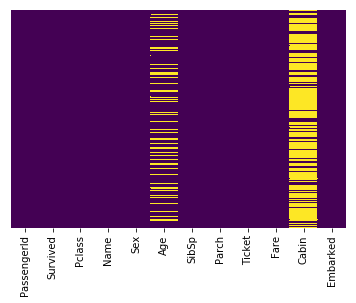

In [18]:
sns.heatmap(train.isnull(), yticklabels=False, cbar=False, cmap='viridis')

### Drop all Not Available Values

In [19]:
train['Cabin'].dropna().head(5)

1      C85
3     C123
6      E46
10      G6
11    C103
Name: Cabin, dtype: object

### Drop a column

In [20]:
train.drop('Cabin', axis=1, inplace=True)

## Explore data

In [21]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [22]:
# pd.read_excel('tabn322.10.xls', header = 1)
df = pd.read_csv('1_linear_regression/USA_Housing.csv')

In [23]:
# Column count, Row count, Type of data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 7 columns):
Avg. Area Income                5000 non-null float64
Avg. Area House Age             5000 non-null float64
Avg. Area Number of Rooms       5000 non-null float64
Avg. Area Number of Bedrooms    5000 non-null float64
Area Population                 5000 non-null float64
Price                           5000 non-null float64
Address                         5000 non-null object
dtypes: float64(6), object(1)
memory usage: 273.5+ KB


In [24]:
# count, mean, standard deviation, min value, max value, percentile 
df.describe()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03
mean,68583.108984,5.977222,6.987792,3.981330,36163.516039,1.232073e+06
std,10657.991214,0.991456,1.005833,1.234137,9925.650114,3.531176e+05
min,17796.631190,2.644304,3.236194,2.000000,172.610686,1.593866e+04
25%,61480.562388,5.322283,6.299250,3.140000,29403.928702,9.975771e+05
50%,68804.286404,5.970429,7.002902,4.050000,36199.406689,1.232669e+06
75%,75783.338666,6.650808,7.665871,4.490000,42861.290769,1.471210e+06
max,107701.748378,9.519088,10.759588,6.500000,69621.713378,2.469066e+06


### Plotly Cufflinks

In [25]:
import pandas as pd
import numpy as np
%matplotlib inline

from plotly import __version__
print(__version__)

import cufflinks as cf

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

cf.go_offline()

3.7.0


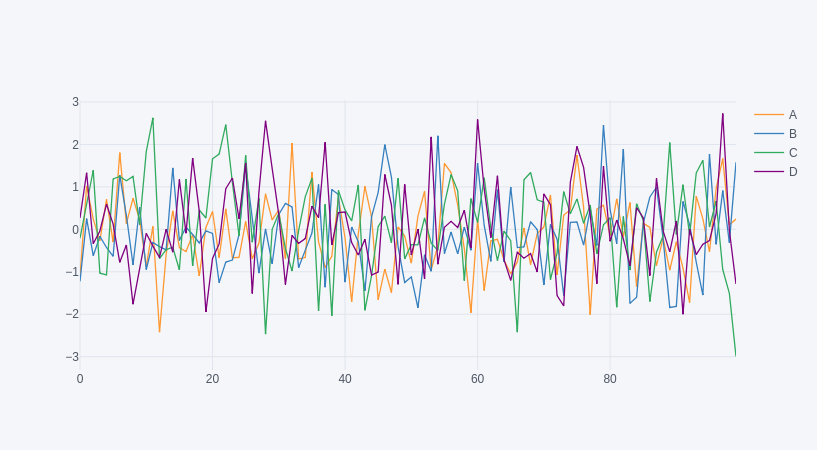

In [26]:
dfForPlotly = pd.DataFrame(np.random.randn(100,4), columns="A B C D".split())

# Show
dfForPlotly.iplot()
# offline mode: Save iplot in export_example.html
# dfForPlotly.iplot(filename='export_example', asUrl=True)

### Pairplot PairGrid

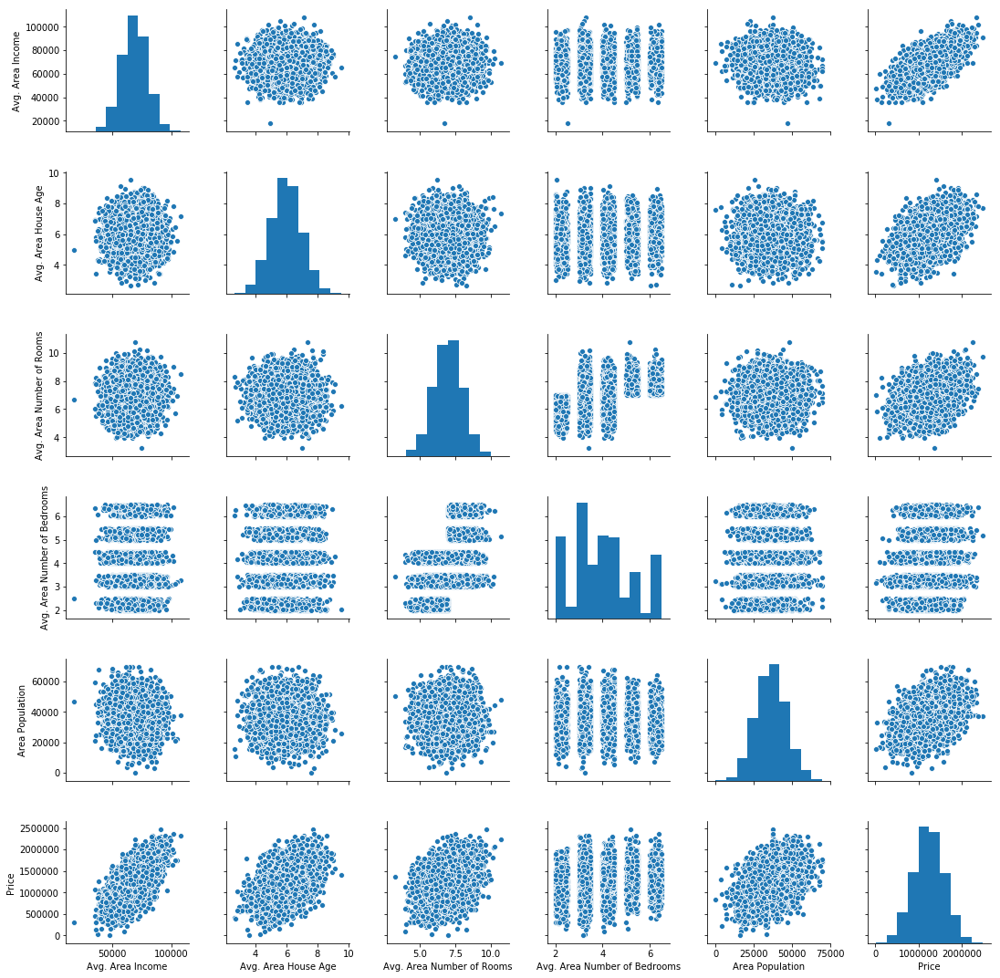

In [27]:
# Diagonal axis is probability of occurence (univariate distribution) 
sns.pairplot(df)

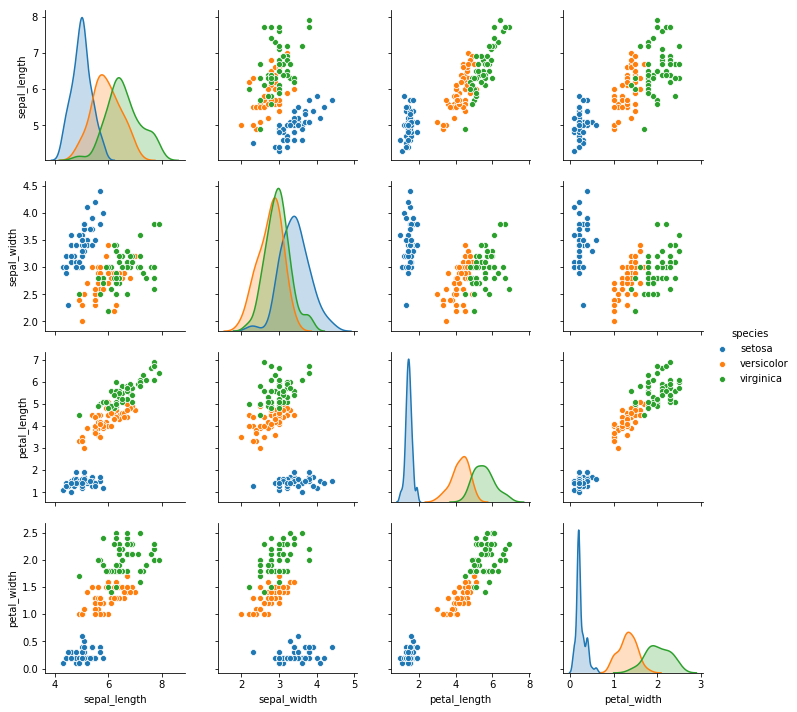

In [28]:
iris = sns.load_dataset('iris')
# pairplot: Diagonal axis is probability of occurence (univariate distribution) 
g = sns.pairplot(iris, hue='species')

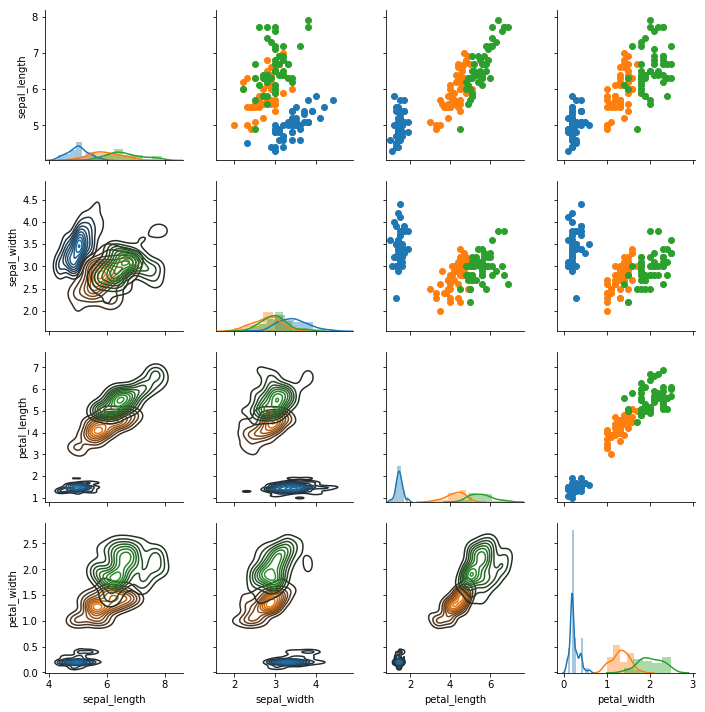

In [29]:
# PairGrid: diagonal axis can be whatever you want (distance plot here)
g = sns.PairGrid(iris, hue='species')
g.map_diag(func=sns.distplot)
g.map_upper(plt.scatter)
g.map_lower(func=sns.kdeplot)

### Regression plot

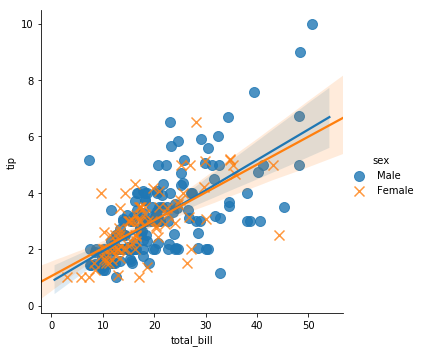

In [30]:
tips = sns.load_dataset('tips')
sns.lmplot(x='total_bill', y='tip', data=tips, hue='sex', markers=['o','x'], scatter_kws={'s':100})

### Interactive

#### Plotly and cufflinks

In [31]:
%matplotlib inline

from plotly import __version__
print(__version__)

import cufflinks as cf

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

cf.go_offline()

3.7.0


In [32]:
df2= pd.DataFrame({'Category': ['A', 'B', 'C'], 'Values': [32, 43, 50]})

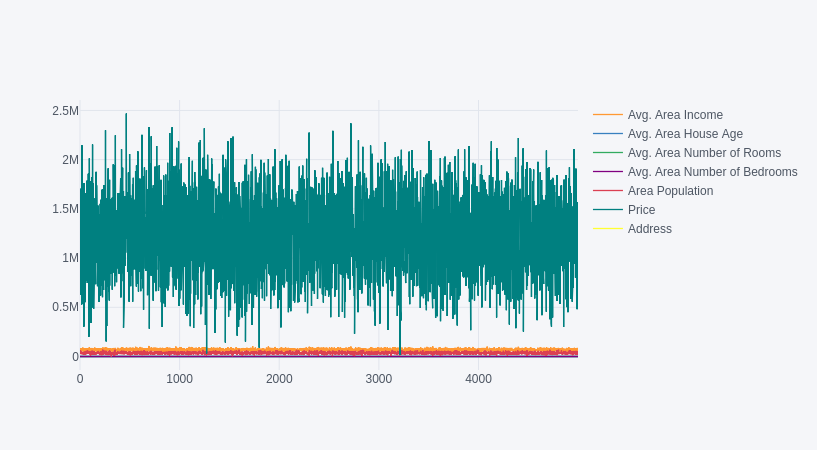

'file:///home/julien/Programs/AI/myCodeDeepLearning/deepLearningAPI/myAlgorithm/export_example.html'

In [33]:
# Show
df.iplot()
# offline mode: Save iplot in export_example.html
df.iplot(filename='export_example', asUrl=True)

## Logistic Regression

In [34]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.model_selection import train_test_split

In [35]:
train = pd.read_csv('2_logistic_regression/titanic_train.csv')

### Clean

In [36]:
def impu_age(cols):
    Age = cols[0]
    Pclass = cols[1]
    
    if pd.isnull(Age):
        if Pclass == 1:
            return 37
        elif Pclass == 2:
            return 29
        else:
            return 24
    else:
        return Age

sex = pd.get_dummies(train['Sex'], drop_first=True)
embark = pd.get_dummies(train['Embarked'], drop_first=True)
train = pd.concat([train, sex, embark], axis=1)
train.drop(['Cabin','PassengerId', 'Sex', 'Embarked', 'Name', 'Ticket'], axis=1, inplace=True)
train['Age'] = train[['Age', 'Pclass']].apply(impu_age, axis=1)
train.head()

,Survived,Pclass,Age,SibSp,Parch,Fare,male,Q,S
0,0,3,22.0,1,0,7.2500,1,0,1
1,1,1,38.0,1,0,71.2833,0,0,0
2,1,3,26.0,0,0,7.9250,0,0,1
3,1,1,35.0,1,0,53.1000,0,0,1
4,0,3,35.0,0,0,8.0500,1,0,1


### Create the training and test dataset

In [37]:
X = train.drop('Survived', axis=1)
y = train['Survived']

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101 )

In [39]:
X_train.head()

,Pclass,Age,SibSp,Parch,Fare,male,Q,S
520,1,30.0,0,0,93.5000,0,0,1
510,3,29.0,0,0,7.7500,1,1,0
446,2,13.0,0,1,19.5000,0,0,1
2,3,26.0,0,0,7.9250,0,0,1
691,3,4.0,0,1,13.4167,0,0,0


In [40]:
# Survived True or False
y_train.tail()

575    0
838    1
337    1
523    1
863    0
Name: Survived, dtype: int64

### Train the model

In [41]:
from sklearn.linear_model import LogisticRegression

In [42]:
logmodel = LogisticRegression()

In [43]:
logmodel.fit(X_train, y_train)

/home/julien/Programs/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

### Predict

In [44]:
predictions = logmodel.predict(X_test)

### Evaluate the result

In [45]:
from sklearn.metrics import classification_report

#### Classification report

- precision: Precision is the ability of a classiifer not to label an instance positive that is actually negative. For each class it is defined as as the ratio of true positives to the sum of true and false positives. Said another way, **“for all instances classified positive, what percent was correct?”**
- recall: Recall is the ability of a classifier to find all positive instances. For each class it is defined as the ratio of true positives to the sum of true positives and false negatives. Said another way, **“for all instances that were actually positive, what percent was classified correctly?”**
- f1 score: The F1 score is a weighted harmonic mean of precision and recall such that the best score is 1.0 and the worst is 0.0. Generally speaking, F1 scores are lower than accuracy measures as they embed precision and recall into their computation. As a rule of thumb, the weighted average of F1 should be used to compare classifier models, not global accuracy.
- support: Support is the number of actual occurrences of the class in the specified dataset. Imbalanced support in the training data may indicate structural weaknesses in the reported scores of the classifier and could indicate the need for stratified sampling or rebalancing. Support doesn’t change between models but instead diagnoses the evaluation process.

$precision = \frac{true\_positives}{true\_positives+false\_positives}$

$recall = \frac{true\_positives}{true\_positives+false\_negatives}$

f1 score: Combining Precision and Recall using harmonic mean.
Typically, the harmonic mean is appropriate for situations when the average of rates or ratios is desired.

$Harmonic\_mean = \frac{n}{1/x_1 + 1/x_2 + ... + 1/x_n} = \frac{n}{\sum_{i=1}^{n} \frac{1}{x_{i}}}$

$f1\_score = 2*\frac{precision \times{recall}}{precision + recall}$

- A macro-average calculates the metric autonomously for each class to calculate the average.
- In contrast, the micro-average calculates average metric from the aggregate contributions of all classes.

Micro-average is used in unbalanced datasets as this method takes the frequency of each class into consideration.
The micro average precision, recall, and accuracy scores are mathematically equivalent.

In [46]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.77      0.86      0.81       154
           1       0.78      0.65      0.71       114

   micro avg       0.77      0.77      0.77       268
   macro avg       0.77      0.76      0.76       268
weighted avg       0.77      0.77      0.77       268



#### Confusion matrix

A confusion matrix is an N X N matrix, where N is the number of classes being predicted.

![confusion_matrix](img/confusion_matrix.png)

Logistic regression confusion matrix:
```
[[true_negative, false_positive]
[false_negative, true_positive]]
```

In [47]:
from sklearn.metrics import confusion_matrix

In [48]:
confusion_m = confusion_matrix(y_test, predictions)
print(confusion_m)
# Identical to previousline
true_negative, false_positive, false_negative, true_positive = confusion_m.ravel()
print(true_negative, false_positive)
print(false_negative, true_positive)

[[133  21]
 [ 40  74]]
133 21
40 74


#### Accuracy score

In [49]:
from sklearn.metrics import accuracy_score

In [50]:
accuracy_score(y_test, predictions)

0.7723880597014925

## Linear regression

In [70]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [71]:
df = pd.read_csv('1_linear_regression/USA_Housing.csv')
df.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386


### Create the training and test dataset

In [72]:
from sklearn.model_selection import train_test_split

In [73]:
X = df[['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population']]

y = df['Price']
# test_size allocated to the test dataset (here 33%)
# random_state=42 (set of random splits on your data
# ensure that the random split gives the same result as other users)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [74]:
from sklearn.linear_model import LinearRegression

In [75]:
X_train.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population
1522,67716.748222,6.431119,7.753989,5.28,40562.188948
835,78095.352630,6.837193,7.119862,3.00,32346.434992
358,55577.071754,6.533916,7.162536,3.47,19560.012414
138,63876.059910,7.080219,7.187433,3.37,38052.876443
299,52188.118727,5.636892,5.807401,4.03,42495.754677


In [76]:
y_train.head()

1522    1.535782e+06
835     1.538923e+06
358     8.180579e+05
138     1.388530e+06
299     7.838084e+05
Name: Price, dtype: float64

### Train

In [77]:
lm = LinearRegression()

In [78]:
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

### Read the coefficients w and b

In [79]:
# coef (slope): w
lm.coef_

array([2.15898874e+01, 1.66102501e+05, 1.19895936e+05, 1.90107101e+03,
       1.52315025e+01])

In [80]:
# intercept: b
lm.intercept_

-2638142.1104287826

In [81]:
coefficient_dataframe = pd.DataFrame(lm.coef_, X.columns, columns=['Coeff'])

In [82]:
coefficient_dataframe

,Coeff
Avg. Area Income,21.589887
Avg. Area House Age,166102.501246
Avg. Area Number of Rooms,119895.936402
Avg. Area Number of Bedrooms,1901.071012
Area Population,15.231503


### Predict

In [83]:
predictions = lm.predict(X_test)

### Read the metrics

**Regression Evaluation Metrics**

Here are the common evaluation metrics for regressions

- **Mean Absolute Error (MAE)**

It is the mean of the absolute value of errors:

$MAE=\frac{1}{n}\sum_{i=1}^{n}\mid y_{i}-\hat{y}_{i}\mid$

- **Mean Squared Error (MSE)**

It is the mean of the squared errors:

$MSE=\frac{1}{n}\sum_{i=1}^{n}(y_{i}-\hat{y}_{i})^2$

- **Root Mean Squared Error (RMSE)**

It is the square root of the mean of the squared errors:

$RMSE=\sqrt{\frac{1}{n}\sum_{i=1}^{n}(y_{i}-\hat{y}_{i})^2}$


#### Comparing these metrics

- MAE is the easiest to understand because it is the averafe error.
- MSE is the more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
- RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are loss functions, because we want to minimize them.

In [84]:
from sklearn import metrics

In [85]:
mae=metrics.mean_absolute_error(y_test, predictions)
mse=metrics.mean_squared_error(y_test, predictions)
rmse=np.sqrt(metrics.mean_squared_error(y_test, predictions))

In [86]:
print('MAE:', mae)
print('MSE:', mse)
print('RMSE:', rmse)

MAE: 80893.81190769987
MSE: 10013679978.582378
RMSE: 100068.37651617207


- R2 score: The $R^2$ (or R Squared) metric provides an indication of the goodness of fit of a set of predictions to the actual values. In statistical literature, this measure is called the coefficient of determination.

This is a value between 0 and 1 for no-fit and perfect fit respectively.

The total sum of squares (proportional to the variance of the data):
$SS_{\text{tot}}=\sum _{i}(y_{i}-{\bar {y}})^{2}$

The regression sum of squares, also called the explained sum of squares:
$SS_{\text{reg}}=\sum _{i}(f_{i}-{\bar {y}})^{2}$

The sum of squares of residuals, also called the residual sum of squares:
$SS_{\text{res}}=\sum _{i}(y_{i}-f_{i})^{2}=\sum _{i}e_{i}^{2}$

$R^{2}\equiv 1-{SS_{\rm {res}} \over SS_{\rm {tot}}}$

In [87]:
metrics.r2_score(y_test, predictions)

0.9165334724138312

### Residuals

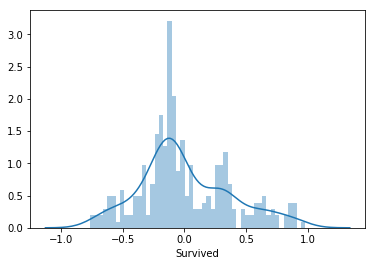

In [69]:
sns.distplot((y_test-predictions), bins=50)